In [1]:
from DeriveAlive import DeriveAlive as da
from DeriveAlive import rootfinding as rf
from DeriveAlive import optimize as opt
from DeriveAlive import spline as sp
from IPython.display import HTML
import numpy as np
import surprise
import matplotlib.pyplot as plt

# Demo 1: Declare Variables

## 1. Constant (scalar or vector): User must initialize derivative to 'None'. Otherwise, the variable will be denoted as an $\mathbb{R}^1$ variable with derivative $[1]$.

In [2]:
a = da.Var([1], None)
a

Var([1], None)

## 2. Scalar functions ($\mathbb{R}^1$ to $\mathbb{R}^1$)

In [3]:
# 1) The first way to denote a scalar variable, with default derivative [1]
x = da.Var([1])
x 

Var([1], [1])

In [4]:
# 2) The second way to denote a scalar variable, by explicitly setting the derivative
x = da.Var([1], [1])

In [5]:
# Denote a scalar function
f = 2 * x + np.sin(x)
f

Var([2.84147098], [2.54030231])

In [6]:
# Define a callable scalar function:
def f(x):
    return 2 * x + np.sin(x)
print (f)

<function f at 0x10bb71a60>


## 3. Vector variables and functions

###  1)  $\mathbb{R}^3$ to $\mathbb{R}^1$  function

In [7]:
x = da.Var([1], [1, 0, 0])
y = da.Var([2], [0, 1, 0])
z = da.Var([3], [0, 0, 1])
print('x: ',format(x))
print('y: ',format(y))
print('z: ',format(z))

x:  Var([1], [1 0 0])
y:  Var([2], [0 1 0])
z:  Var([3], [0 0 1])


In [8]:
f = x + y + z
print(f)

Var([6], [1 1 1])


Alternatively, the user can define the $\mathbb{R}^3$ to $\mathbb{R}^1$ function by explicitly defining a da.Var vector with one entry:

In [9]:
g = da.Var([2 * x + x * y])
print(g)

Var([4], [4 1 0])


###  2)  $\mathbb{R}^1$ to $\mathbb{R}^3$  function

In [10]:
w = da.Var([1])
f = da.Var([w, np.sin(w), np.exp(w-1)])
print('x: {}\n\n f: \n{}'.format(w, f))

x: Var([1], [1])

 f: 
Values:
[1.         0.84147098 1.        ],
Jacobian:
[[1.        ]
 [0.54030231]
 [1.        ]]


###  3)  $\mathbb{R}^3$ to $\mathbb{R}^4$  function

In [11]:
f = da.Var([x, y ** 2, z ** 4, x + y + z])
print(f)

Values:
[ 1  4 81  6],
Jacobian:
[[  1   0   0]
 [  0   4   0]
 [  0   0 108]
 [  1   1   1]]


# Demo 2: Forward Mode

### 1)  $\mathbb{R}^1$ to $\mathbb{R}^1$  
Consider the case $f(x) = sin(x) + 5tan(\frac{x}{2})$, where we want to calculate the value and the first derivative of f(x) at $\frac{\pi}{2}$.

In [12]:
x = da.Var([np.pi/2])
f = np.sin(x) + 5 * np.tan(x/2) 
print('Value: {} Derivative: {}'.format(f.val, f.der))
print('Expect value of 6.0, derivative of 5.0')

Value: [6.] Derivative: [5.]
Expect value of 6.0, derivative of 5.0


### 2)  $\mathbb{R}^m$ to $\mathbb{R}^1$  

Consider the case $f(x, y) = (sin(x), x^2)$, where we want to calculate the value and jacobian of f(x) at $x = \frac{\pi}{2}$.

In [13]:
x = da.Var([np.pi/2], [1])
f = da.Var([np.sin(x), x ** 2])
print('\n Value: {} \n\n Derivative: \n{}'.format(f.val, f.der))
print('\n Expect value of [1. 2.4674011], jacobian of [[0], [3.14159265]]')


 Value: [1.        2.4674011] 

 Derivative: 
[[6.12323400e-17]
 [3.14159265e+00]]

 Expect value of [1. 2.4674011], jacobian of [[0], [3.14159265]]


### 3)  $\mathbb{R}^m$ to $\mathbb{R}^n$  

Consider the case $f(x, y, z) = (sin(x), 4y + z^3)$, where we want to calculate the value and the jacobian of $f(x,y,z)$ at $x=\frac{\pi}{2}$, $y=3$, $z=−2$.

In [14]:
x = da.Var([np.pi/2], [1, 0, 0])
y = da.Var([3], [0, 1, 0])
z = da.Var([-2], [0, 0, 1])
f = da.Var([np.sin(x), 4 * y + z ** 3])
print('\n Value: {} \n\n Derivative: \n{}'.format(f.val, f.der))
print('\n Expect value of [1, 4], jacobian of [[0 0 0], [0 4 12]]')


 Value: [1. 4.] 

 Derivative: 
[[6.123234e-17 0.000000e+00 0.000000e+00]
 [0.000000e+00 4.000000e+00 1.200000e+01]]

 Expect value of [1, 4], jacobian of [[0 0 0], [0 4 12]]


# Demo 3: Root Finding

### How to use DeriveAlive for Root Finding?
* Input function as a string
* Define start point
* Let DeriveAlive do the work to find the root
* DeriveAlive will nicely present you the trace fromm start point to the root

### Case 1:  $f = sin(x)$ with starting point $x_0= \frac{3\pi}{2}$
Note: Newton method is not guaranteed to converge when $f\prime(x_0)= 0$.
But in our case, we use flip coin to determine which direction we want to go in order to get stuck at this point, and choose a derivative of $\pm1$.

In [15]:
%%capture

# define f function
f_string = 'f(x) = sin(x)'

def f(x):
    return np.sin(x)

# Start at 3*pi/2 
x0 = 3 * np.pi / 2

# finding the root
for val in [np.pi - 0.25, np.pi, 1.5 * np.pi, 2 * np.pi - 0.25, 2 * np.pi + 0.25]:
    solution, x_path, y_path = rf.NewtonRoot(f, x0)

# visualize the trace
x_lims = -2 * np.pi, 3 * np.pi
y_lims = -2, 2
anim = rf.plot_results(f, x_path, y_path, f_string, x_lims, y_lims, animate=True)

In [16]:
HTML(anim.to_jshtml())

### Case 2:   $f = x - \exp(-2\sin(4x)sin(4x)+0.3$ with starting point $x_0 = 0$

In [17]:
%%capture

# define f function
f_string = 'f(x) = x - e^{-2 * sin(4x) * sin(4x)} + 0.3'

def f(x):
    return x - np.exp(-2.0 * np.sin(4.0 * x) * np.sin(4.0 * x)) + 0.3

# start at 0
x0 = 0

# finding the root
for val in np.arange(-0.75, 0.8, 0.25):
    solution, x_path, y_path = rf.NewtonRoot(f, x0)

# visualize the trace
x_lims = -2, 2
y_lims = -2, 2
anim = rf.plot_results(f, x_path, y_path, f_string, x_lims, y_lims, animate=True)

In [18]:
HTML(anim.to_jshtml())

### Case 3: $f(x, y) = x^2 + 4y^2-2x^2y +4$ with starting points $x_0 =-8.0, y_0 = -5.0$ 

In [19]:
%%capture

# define f function
f_string = 'f(x, y) = x^2 + 4y^2 -2x^2y + 4'

def f(variables):
    x, y = variables
    return x ** 2 + 4 * y ** 2 - 2 * (x ** 2) * y + 4

# start at x0=−8.0,y0= −5
x0 = -8.0
y0 = -5.0
init_vars = [x0, y0]

# finding the root and visualize the trace
solution, xy_path, f_path = rf.NewtonRoot(f, init_vars)
anim = rf.plot_results(f, xy_path, f_path, f_string, threedim=True, animate=True, speed=25)

In [20]:
HTML(anim.to_jshtml())

### Case 4:  $f(x, y, z) = x^2 + y^2 + z^2$ with starting points $x_0 =1, y_0 = -2, z_0 = 5$ 

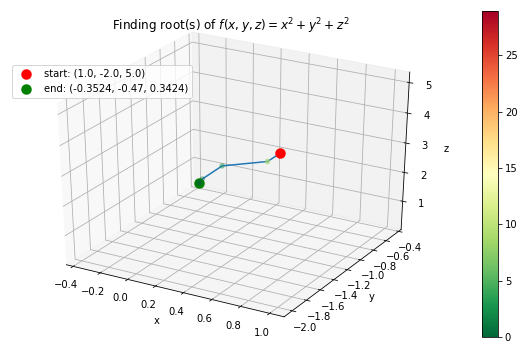

In [21]:
# define f function
f_string = 'f(x, y, z) = x^2 + y^2 + z^2'

def f(variables):
    x, y, z = variables
    return x ** 2 + y ** 2 + z ** 2 + np.sin(x) + np.sin(y) + np.sin(z)

# start at 
x0= 1
y0= -2
z0= 5
init_vars = [x0, y0, z0]

# finding the root and visualize the trace
solution, xyz_path, f_path = rf.NewtonRoot(f, init_vars)
m = len(solution.val)
rf.plot_results(f, xyz_path, f_path, f_string, fourdim=True)

# Demo 4: Optimization (Gradient Descent, Dataset compatability, BFGS)

## Case 1: Minimize quartic function $f(x) = x^4$ 
Get stuck in local minimum.

In [22]:
%%capture

def f(x):
    return x ** 4 + 2 * (x ** 3) - 12 * (x ** 2) - 2 * x + 6

# Function string to include in plot
f_string = 'f(x) = x^4 + 2x^3 -12x^2 -2x + 6'

x0 = 4
solution, xy_path, f_path = opt.GradientDescent(f, x0, iters=200, eta=0.002)
anim = opt.plot_results(f, xy_path, f_path, f_string, x_lims=(-6, 5), y_lims=(-100, 70), animate=True)

In [23]:
HTML(anim.to_jshtml())

## Case 2: Minimize Rosenbrock's function $f(x, y) = 4(y - x^2)^2 + (1 - x)^2$ 
Global minimum: $0$ at $(x,y)=(1, 1)$.

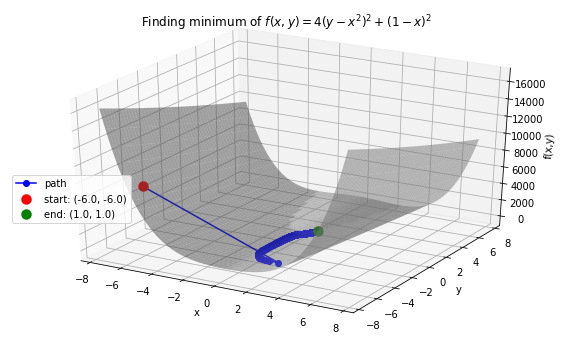

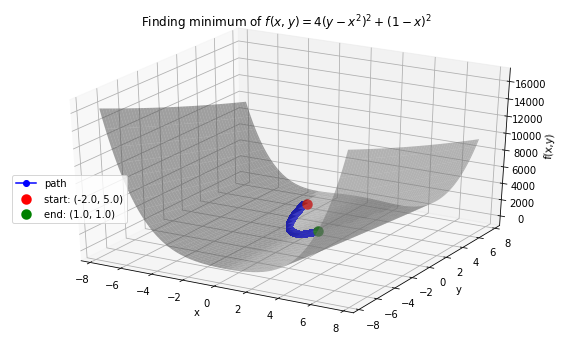

In [24]:
# Rosenbrock function with leading coefficient of 4
def f(variables):
    x, y = variables
    return 4 * (y - (x ** 2)) ** 2 + (1 - x) ** 2

# Function string to include in plot
f_string = 'f(x, y) = 4(y - x^2)^2 + (1 - x)^2'

for x_val, y_val in [[-6, -6], [-2, 5]]:
    init_vars = [x_val, y_val]
    solution, xy_path, f_path = opt.GradientDescent(f, init_vars, iters=25000, eta=0.002)
    opt.plot_results(f, xy_path, f_path, f_string, x_lims=(-7.5, 7.5), threedim=True)

Note the large first step in the first plot, since the step size is proportional to the size of the gradient, and the gradient is very high away from the minimum.

Note the smaller step sizes in the second plot, since the initial value is at a very shallow gradient.

## Case 3: Minimize Easom's function:  $f(x, y) = -cos(x)cos(y)exp(-((x - \pi)^2 + (y - \pi)^2))$ 
Global minimum: $-1$ at $(x,y)=(\pi, \pi)$.

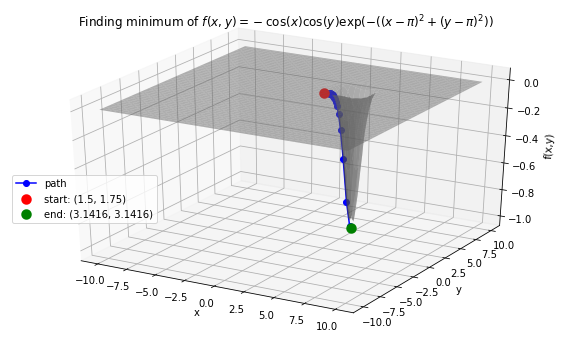

In [25]:
# Easom's function
def f(variables):
    x, y = variables
    return -np.cos(x) * np.cos(y) * np.exp(-((x - np.pi) ** 2 + (y - np.pi) ** 2))

# Function string to include in plot
f_string = 'f(x, y) = -\cos(x)\cos(y)\exp(-((x-\pi)^2 + (y-\pi)^2))'

# Initial guess
x0 = 1.5
y0 = 1.75
init_vars = [x0, y0]

# Visulaize gradient descent
solution, xy_path, f_path = opt.GradientDescent(f, init_vars, iters=10000, eta=0.3)
opt.plot_results(f, xy_path, f_path, f_string, threedim=True)

## Case 4: Machine Learning application: minimize mean squared error in regression
$$\begin{align}
\hat{y_i} &= \textbf{w}^\top \textbf{x}_i \\
MSE(X, y) &= \frac{1}{m} \sum_{i=1}^m (\textbf{w}^\top\textbf{x}_i - y_i)^2
\end{align}$$
where $\textbf{w}$ contains an extra dimension to fit the intercept of the features.

## Optimal weights (closed form solution) to minimize MSE: $\textbf{w}^* = (\textbf{X}^\top \textbf{X})^{-1}\textbf{X}^\top \textbf{y}$
### Features: $\textbf{X} \in \mathbb{R}^{M \times N}$ (number of samples x number of features), including column of 1s for bias term
### Output: $\textbf{y} \in \mathbb{R}^M$ (number of samples)
### Weights: $\textbf{w} \in \mathbb{R}^N$ (number of features, including bias)

## Example dataset
### Standardized dataset: 47 homes from Portland, Oregon
### Features: area (square feet), number of bedrooms
### Output: price (in thousands of dollars)

In [26]:
data = []
with open('normalized.txt', 'r') as f:
    dataset = f.readlines()
    for row in dataset:
        vals = map(float, row.split(','))
        area, bedrooms, price = vals
        data.append([area, bedrooms, price / 1000.])
    data = np.array(data)

print ("Dataset shape: {}".format(data.shape))
print ("\nDataset sample:\n{}".format(data[:5]))   

Dataset shape: (47, 3)

Dataset sample:
[[ 1.30009869e-01 -2.23675187e-01  3.99900000e+02]
 [-5.04189838e-01 -2.23675187e-01  3.29900000e+02]
 [ 5.02476364e-01 -2.23675187e-01  3.69000000e+02]
 [-7.35723065e-01 -1.53776691e+00  2.32000000e+02]
 [ 1.25747602e+00  1.09041654e+00  5.39900000e+02]]


### Compute closed form solution for comparison

In [27]:
X = data[:, :2]
X = np.hstack((np.ones((len(X), 1)), X))
y = data[:, 2]
w_opt = np.matmul(np.linalg.inv(np.matmul(X.T, X)), np.matmul(X.T, y))
print ("Closed form optimal weights:\n{}".format(w_opt))

Closed form optimal weights:
[340.41265957 110.63105028  -6.64947427]


### Compare to gradient descent method 

Gradient descent optimized weights:
[340.41265957 110.62984204  -6.64826603]


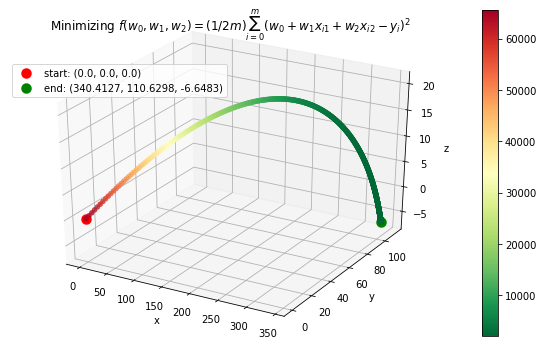

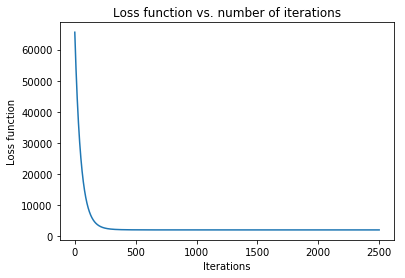

In [28]:
f = "mse"
init_vars = [0, 0, 0]

# Function string to include in plot
f_string = 'f(w_0, w_1, w_2) = (1/2m)\sum_{i=0}^m (w_0 + w_1x_{i1} + w_2x_{i2} - y_i)^2'

# Visulaize gradient descent
solution, w_path, f_path, f = opt.GradientDescent(f, init_vars, iters=2500, data=data)
print ("Gradient descent optimized weights:\n{}".format(solution.val))
opt.plot_results(f, w_path, f_path, f_string, x_lims=(-7.5, 7.5), fourdim=True)

## Stationary points: BFGS

## Case 5: Find stationary point of f(x) = sin(x). Note: BFGS finds stationary point, which can be maximum, not minimum.

In [29]:
%%capture

def f(x):
    return np.sin(x)

f_string = 'f(x) = sin(x)'

x0 = 0.7
solution, x_path, f_path = opt.BFGS(f, x0)
anim = opt.plot_results(f, x_path, f_path, f_string, x_lims=(-2 * np.pi, 2 * np.pi), y_lims=(-1.5, 1.5), animate=True, bfgs=True)

In [30]:
HTML(anim.to_jshtml())

## Case 6: Find stationary point of Rosenbrock function: $f(x, y) = 4(y - x^2)^2 + (1 - x)^2$ 
Stationary point: $0$ at $(x,y)=(1, 1)$.

In [31]:
%%capture

def f(variables):
    x, y = variables
    return 4 * (y - (x ** 2)) ** 2 + (1 - x) ** 2

f_string = 'f(x, y) = 4(y - x^2)^2 + (1 - x)^2'

x0, y0 = -6, -6
init_vars = [x0, y0]
solution, xy_path, f_path = opt.BFGS(f, init_vars, iters=25000)
xn, yn = solution.val
anim = opt.plot_results(f, xy_path, f_path, f_string, x_lims=(-7.5, 7.5), y_lims=(-7.5, 7.5), threedim=True, animate=True, bfgs=True)

In [32]:
HTML(anim.to_jshtml())

# Demo 5: Quadratic Spline

Plot the quadratic spline of $f_1(x) = 10^x, x \in [-1, 1]$ with 10 intervals.

0.0038642295476335278

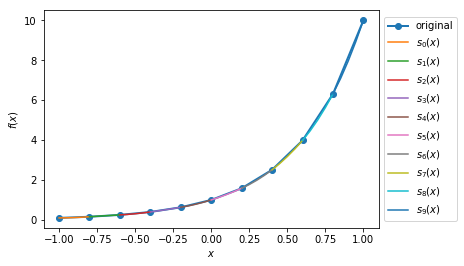

In [33]:
def f1(var):
    return 10**var

xMin1 = -1
xMax1 = 1
nIntervals1 = 10
nSplinePoints1 = 5

y1, A1, coeffs1, ks1 = sp.quad_spline_coeff(f1, xMin1, xMax1, nIntervals1)
fig1 = sp.quad_spline_plot(f1, coeffs1, ks1, nSplinePoints1)
spline_points1 = sp.spline_points(f1, coeffs1, ks1, nSplinePoints1)
sp.spline_error(f1, spline_points1)

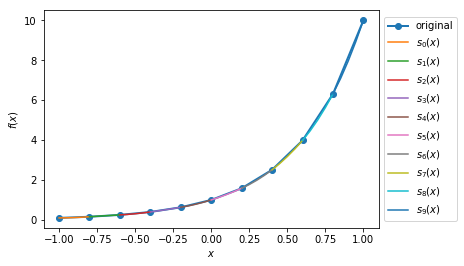

In [34]:
fig1

Plot the quadratic spline of $f_3(x) = \sin(x), x \in [-1,1]$ and $x \in [-\pi, \pi]$ with 5 intervals and 10 intervals.

0.015578205778177232

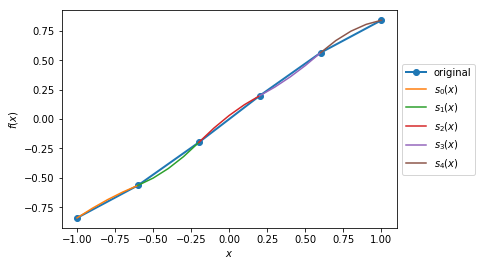

In [35]:
def f3(var):
    return np.sin(var)

xMin3 = -1
xMax3 = 1
nIntervals3 = 5
nSplinePoints3 = 5

y3, A3, coeffs3, ks3 = sp.quad_spline_coeff(f3, xMin3, xMax3, nIntervals3)
fig3 = sp.quad_spline_plot(f3, coeffs3, ks3, nSplinePoints3)
spline_points3 = sp.spline_points(f3, coeffs3, ks3, nSplinePoints3)
sp.spline_error(f3, spline_points3)

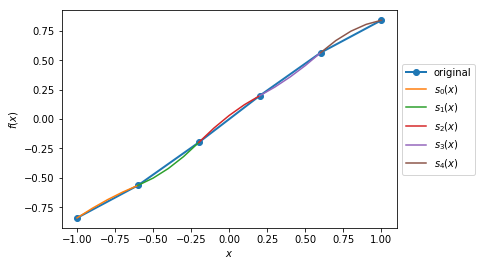

In [36]:
fig3

0.003495428745548953

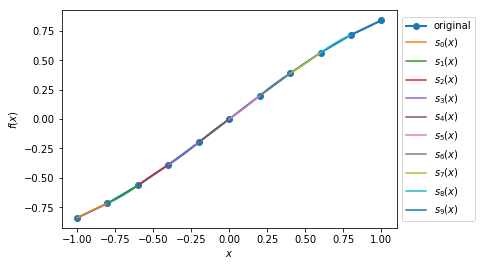

In [37]:
xMin4 = -1
xMax4 = 1
nIntervals4 = 10
nSplinePoints4 = 5

y4, A4, coeffs4, ks4 = sp.quad_spline_coeff(f3, xMin4, xMax4, nIntervals4)
fig4 = sp.quad_spline_plot(f3, coeffs4, ks4, nSplinePoints4)
spline_points4 = sp.spline_points(f3, coeffs4, ks4, nSplinePoints4)
sp.spline_error(f3, spline_points4)

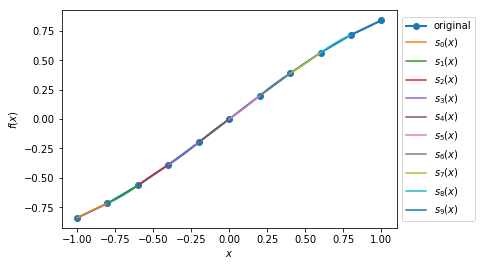

In [38]:
fig4

Adding more intervals does make the quadratic splines fit better. We will demonstrate this with $f(x) = 10^x, x \in [-\pi, \pi]$ at intervals from 5 to 100.

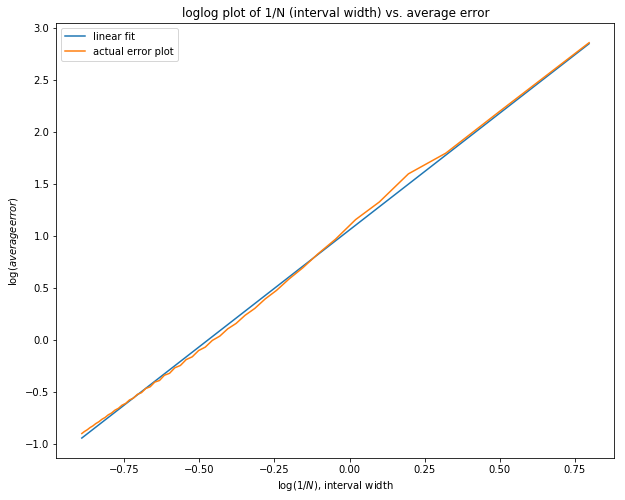

In [39]:
def f(var):
    return 10 ** var

xMin = -sp.np.pi
xMax = sp.np.pi
nIntervalsList = sp.np.arange(1, 50, 1)
nSplinePoints = 10
squaredErrorList = []

for nIntervals in nIntervalsList:
    y, A, coeffs, ks = sp.quad_spline_coeff(f, xMin, xMax, nIntervals)
    spline_points = sp.spline_points(f, coeffs, ks, nSplinePoints)
    error = sp.spline_error(f, spline_points)
    squaredErrorList.append(error)
    
plt.figure(figsize=(10, 8))
    
coefficients = np.polyfit(np.log10(2*np.pi/nIntervalsList), np.log10(squaredErrorList), 1)
polynomial = np.poly1d(coefficients)
ys = polynomial(np.log10(2*np.pi/nIntervalsList))
plt.plot(np.log10(2*np.pi/nIntervalsList), ys, label='linear fit')

# plt.loglog(2*np.pi/nIntervalsList, squaredErrorList)
plt.plot(np.log10(2*np.pi/nIntervalsList), np.log10(squaredErrorList), label='actual error plot')
plt.xlabel(r'$N$')
plt.ylabel('squared error')
plt.xlabel(r'$\log(1/N)$, interval width')
plt.ylabel(r'$\log(average error)$')
plt.legend()
plt.title('loglog plot of 1/N (interval width) vs. average error')
plt.show()

In [40]:
beta, alpha = coefficients[0], 10**coefficients[1]

In [41]:
beta, alpha

(2.2462166565958177, 11.414027075895731)

# Extra: How to plot the following 20 functions?

$f_1(x) = \frac{-1}{0.5^2} x^2 + 1, x \in [-0.5, 0]$

$f_2(x) = \frac{1}{0.5^2} x^2 - 1, x \in [-0.5, 0]$

$f_3(x) = \frac{-1}{0.5} x^2 + 1, x \in [0, 0.5]$

$f_4(x) = \frac{1}{0.5} x^2 - 1, x \in [0, 0.5]$

$f_6(x) = \frac{-1}{0.5} (x-1.5)^2 + 1, x \in [1, 1.5]$

$f_7(x) = \frac{1}{0.5} (x-1.5)^2 - 1, x \in [1, 1.5]$

$f_8(x) = \frac{-1}{0.5} (x-1.5)^2, x \in [1.5, 2]$

$f_9(x) = \frac{-1}{0.5} (x-1.5)^2 + 1, x \in [1.5, 2]$

$f_{10}(x) = \frac{1}{0.5} (x-1.5)^2 - 1, x \in [1.5, 2]$

$f_{11}(x) = \frac{-1}{0.5} (x-3)^2 + 1, x \in [2.5, 3]$

$f_{12}(x) = \frac{-1}{0.5} (x-3)^2 + 1, x \in [3, 3.5]$

$f_{13}(x) = 1.5x - 4.75, x \in [2.5, 3.5]$

$f_{14}(x) = -1, x \in [2.5, 3.5]$

$f_{15}(x) = \frac{-1}{0.5^2} (x-4.5)^2 + 1, x \in [4, 4.5]$

$f_{16}(x) = \frac{1}{0.5^2} (x-4.5)^2 - 1, x \in [4, 4.5]$

$f_{17}(x) = \frac{-1}{0.5^2} (x-4.5)^2 + 1, x \in [4, 4.5]$

$f_{18}(x) = \frac{1}{0.5^2} (x-4.5)^2 - 1, x \in [4.5, 5]$

$f_{19}(x) = 1, x \in [5.5, 6.5]$

$f_{20}(x) = \frac{-1}{(-0.75)^2} (x-6.5)^2 + 1, x \in [5.75, 6.5]$

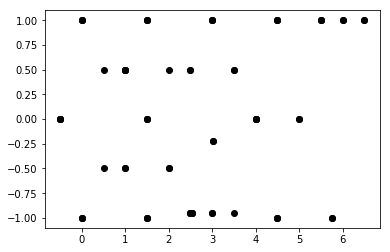

In [42]:
surprise.drawPoints()

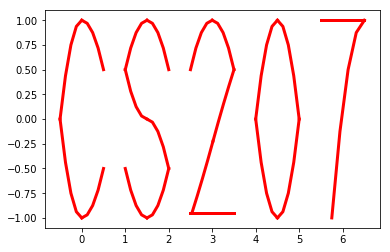

In [43]:
surprise.drawSpline()

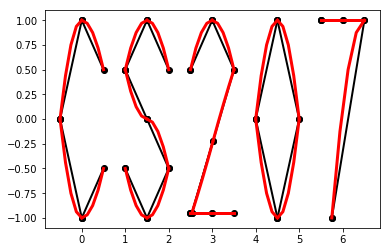

In [44]:
surprise.drawTogether()